# Image Intensity
Image Intensity = f(Illumination, Surface Orientation, Surface Reflectance)->parameters (image intensity understanding is under-constrained)



# Radiometric Concepts
2D radian : ${\displaystyle d\theta={\frac {dl}{r}}}$\
3D steradian : ${\displaystyle d\omega={\frac {dA'}{r^{2}}}={\frac {dA cos\theta}{r^{2}}}}$\
From light source flux : ${\displaystyle E={\frac {J d\omega}{dA}}={\frac {J cos\theta}{r^{2}}}}$\
light emitting from surface : ${\displaystyle L={\frac {d^{2}\Phi}{(dAcos\theta_{r})d\omega}}}$

# Scene Radiance and Image Irradiance
${\displaystyle {\frac {dA_s}{dA_i}}={\frac {cos\alpha}{cos\theta}}(\frac {z}{f})^2}$ - eq(1)

${\displaystyle d\omega_L={\frac {\pi d^2}{4}}{\frac {cos\alpha}{(z/cos\alpha)^2}}}$ - eq(2)

${\displaystyle d^{2}\Phi=L{(dA_scos\theta)d\omega_L}}$ - eq(3)

${\displaystyle d\Phi=EdA_i}$ - eq(4)

${\displaystyle E=L{\frac {\pi}{4}}({\frac{d}{f}})^2 cos^4\alpha}$

# BRDF (Bidirectional Reflectance Distribution Function)
BRDF: $f(\theta_i,\phi_i,\theta_r,\phi_r) = \frac {L(\theta_r, \phi_r)}{E(\theta_i, \phi_i)}$\
$f(\theta_i,\phi_i,\theta_r,\phi_r) > 0$\
$f(\theta_i,\phi_i,\theta_r,\phi_r)=f(\theta_r,\phi_r,\theta_i,\phi_i)$

# Reflectance Models
Image Intensity = Body Reflection + Surface Reflection

$\rho_d$: Albedo ($0 \leq \rho_d \leq 1$)

Lambertian Model (body) : surface appears equally bright from ALL directions, Lambertian BRDF: $f(\theta_i,\phi_i,\theta_r,\phi_r)=\frac {\rho_d}{\pi}$

$L=\frac{\rho_d}{\pi} \frac{J}{r^2} (\overline{n}\dot\overline{s})$

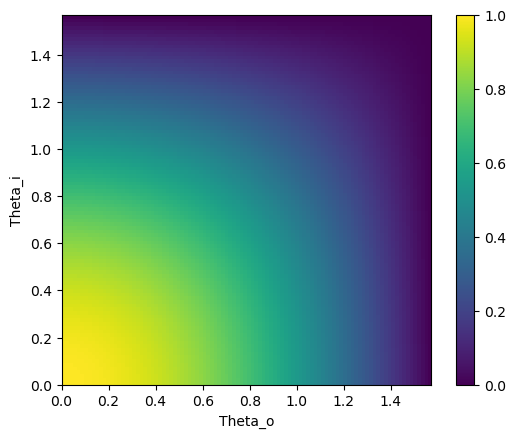

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def brdf(theta_i, phi_i, theta_o, phi_o):
    # Estimate the BRDF given the incident and exitant angles
    brdf = np.cos(theta_i) * np.cos(theta_o)
    return brdf

# Define the incident and exitant angles
theta_i = np.linspace(0, np.pi/2, 100)
phi_i = np.zeros_like(theta_i)
theta_o = np.linspace(0, np.pi/2, 100)
phi_o = np.zeros_like(theta_o)

# Evaluate the BRDF for all combinations of incident and exitant angles
brdf_vals = np.zeros((100, 100))
for i in range(100):
    for j in range(100):
        brdf_vals[i, j] = brdf(theta_i[i], phi_i[i], theta_o[j], phi_o[j])

# Plot the BRDF
plt.imshow(brdf_vals, extent=(0, np.pi/2, 0, np.pi/2), origin='lower')
plt.xlabel('Theta_o')
plt.ylabel('Theta_i')
plt.colorbar()
plt.show()


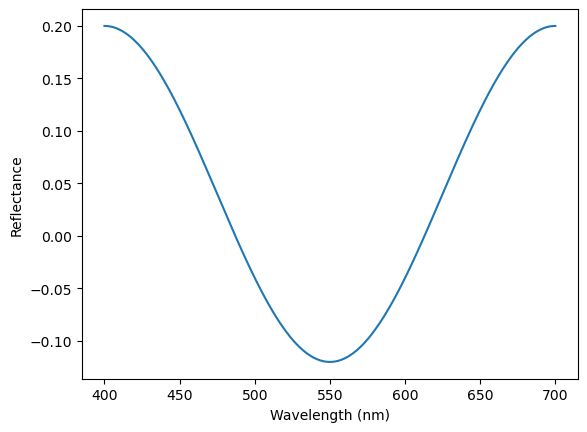

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def dichromatic_reflectance(wavelength, reflectance_a, reflectance_b, albedo):
    # Estimate the reflectance of a surface using a dichromatic reflectance model
    reflectance = albedo * (reflectance_a + reflectance_b * np.cos(2 * np.pi * wavelength))
    return reflectance

# Define the wavelength range in nm
wavelength = np.linspace(400, 700, 300)

# Define the reflectance coefficients a and b
reflectance_a = 0.05
reflectance_b = 0.2

# Define the albedo
albedo = 0.8

# Evaluate the dichromatic reflectance model for the given wavelength range
dichromatic_reflectance_vals = dichromatic_reflectance(wavelength, reflectance_a, reflectance_b, albedo)

# Plot the dichromatic reflectance
plt.plot(wavelength, dichromatic_reflectance_vals)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.show()


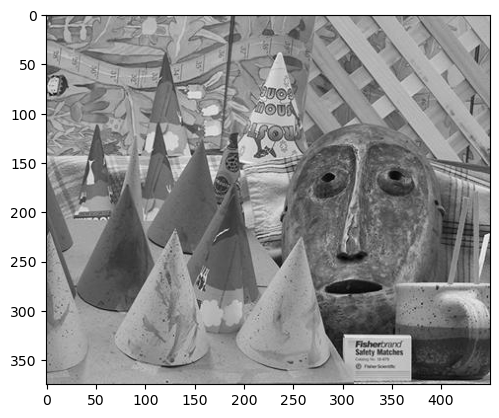

In [201]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import timeit
def computedisparity1(left,right):
    max_disparity = 20
    size = left.shape
    
    kernelSize = 8    # This kernel defines a neighborhood for the pixel as a square in which it is centered
    disp = np.zeros(size)    # Disparity map is initialized
    
    for y in range(size[0]):    # For each column
        y_kernel = (max(0, y-int(kernelSize/2)), min(size[0]-1, y+int(kernelSize/2)))    # set the vertical boundaries of the kernel
        for x in range(size[1]):    # For each row
            x_kernel = (max(0, x-int(kernelSize/2)), min(size[1]-1, x+int(kernelSize/2)))    # set the horizontal boundaries of the kernel
            
            # Since the images are rectified, we will only search horizontally
            max_disp = min([max_disparity, size[1]-x_kernel[1]])    # We can't search further than the amount of pixels left to the right
            template = right[y_kernel[0]:y_kernel[1], x_kernel[0]:x_kernel[1]]    # This is the sub image, region that the kernel covers
            
            SSD = np.zeros(max_disp + 1)    # Similarity matrix of sum of squared differences
            for i in range(max_disp+1):
                block = left[y_kernel[0]:y_kernel[1], x_kernel[0]+i:x_kernel[1]+i]    # Sub-image on the left image to be compared
                SSD[i] = np.sum((template-block)**2)    # SSD value for each step of the scan
                
            disparity = np.amin(SSD)      # Get the minimum value in the cost matrix
            dis_index = np.argmin(SSD)    # Get the index of minimum value in the cost matrix
            
            if ((dis_index == 0) or (dis_index == max_disp)):
                disp[y,x] = dis_index
            else:
                C3 = SSD[dis_index - 1]
                C2 = SSD[dis_index]
                C1 = SSD[dis_index + 1]
                # Below is the sub-pixel disparity estimate formula
                disp[y, x] = dis_index - (0.5 * (C3 - C1) / (C1 + C3 - (2*C2)))
                
    return disp
# Read the image and convert it to grayscale
left = cv2.imread('img/left.png')
left = cv2.cvtColor(left, cv2.COLOR_BGR2GRAY)

plt.imshow(left, cmap='gray')

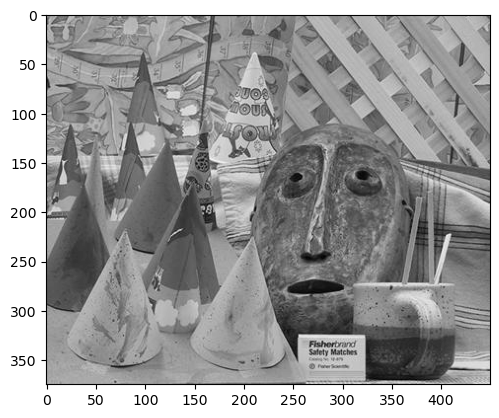

In [202]:
# Read the image and convert it to grayscale
right = cv2.imread('img/right.png')
right = cv2.cvtColor(right, cv2.COLOR_BGR2GRAY)

plt.imshow(right, cmap='gray')

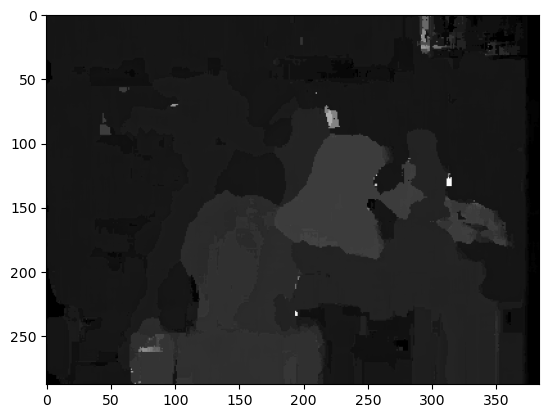

In [23]:
stereo = computedisparity(left, right)

plt.imshow(stereo, cmap='gray')

In [203]:
import cv2
import numpy as np
from numba import jit, njit
import os
os.environ['NUMBA_WARNINGS'] = '0'
@jit(nopython=True)
#@njit(parallel = False)
def computedisparity2(left, right, deep, window):
    max_disparity = deep
    size = left.shape

    kernel_size = window
    disp = np.zeros(size)    
    
    for y in range(size[0]):    
        y_kernel = (max(0, y-int(kernel_size/2)), min(size[0]-1, y+int(kernel_size/2)))
        for x in range(size[1]):
            x_kernel = (max(0, x-int(kernel_size/2)), min(size[1]-1, x+int(kernel_size/2)))
            
            max_disp = min([max_disparity, size[1]-x_kernel[1]])
            template = right[y_kernel[0]:y_kernel[1], x_kernel[0]:x_kernel[1]]
            
            SSD = np.zeros(max_disp + 1)
            for i in range(max_disp+1):
                block = left[y_kernel[0]:y_kernel[1], x_kernel[0]+i:x_kernel[1]+i]
                SSD[i] = np.sum((template-block)**2)
                
            disparity = np.amin(SSD)
            dis_index = np.argmin(SSD)
            
            if ((dis_index == 0) or (dis_index == max_disp)):
                disp[y, x] = dis_index
            else:
                C3 = SSD[dis_index - 1]
                C2 = SSD[dis_index]
                C1 = SSD[dis_index + 1]
                disp[y, x] = dis_index - (0.5 * (C3 - C1) / (C1 + C3 - (2*C2)))
                
    return disp

In [204]:

start = timeit.default_timer()

stereo = computedisparity2(left, right, 50, 20)

stop = timeit.default_timer()

print('Time: ', stop - start)  

Time:  3.682636541983811


16.81592372410672


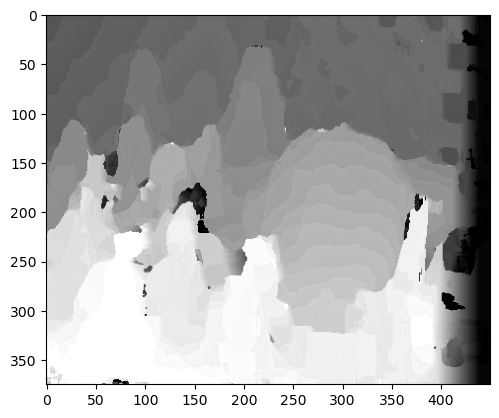

In [205]:
print(stereo[0,0])
plt.imshow(stereo, cmap='gray')

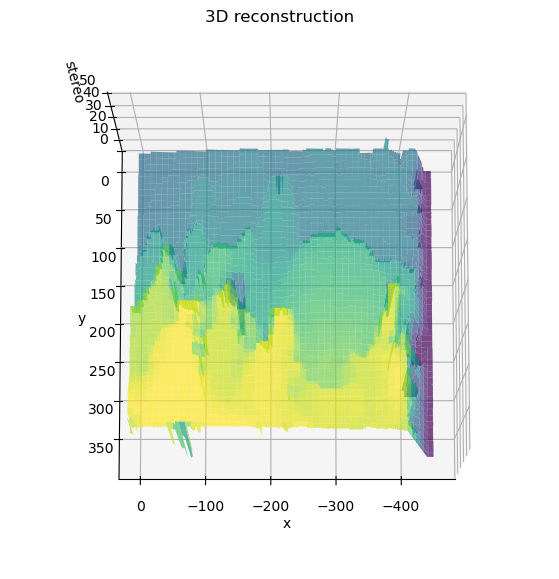

In [210]:
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
 
# Creating dataset
z = stereo
x = np.arange(stereo.shape[1])
y = np.arange(stereo.shape[0])
X, Y = np.meshgrid(x, y)
fig = plt.figure(figsize = (12, 7))
ax = plt.axes(projection='3d')
ax.plot_surface(-X, Y, z, cmap='viridis', alpha=0.7)
ax.view_init(80, 90, 0)
ax.set_title('3D reconstruction')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('stereo')
#ax.scatter3D(-X, Y, z, s=20, color='r')
plt.show()

In [123]:
## Example: How to read and access data from a pickle
import pickle
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from scipy.signal import convolve
from numpy import linalg

def horn_integrate(gx, gy, mask, niter):
    '''
    horn_integrate recovers the function g from its partial 
    derivatives gx and gy. 
    mask is a binary image which tells which pixels are 
    involved in integration. 
    niter is the number of iterations. 
    typically 100,000 or 200,000, 
    although the trend can be seen even after 1000 iterations.
    '''    
    g = np.ones(np.shape(gx))
    
    gx = np.multiply(gx, mask)
    gy = np.multiply(gy, mask)
    
    A = np.array([[0,1,0],[0,0,0],[0,0,0]]) #y-1
    B = np.array([[0,0,0],[1,0,0],[0,0,0]]) #x-1
    C = np.array([[0,0,0],[0,0,1],[0,0,0]]) #x+1
    D = np.array([[0,0,0],[0,0,0],[0,1,0]]) #y+1
    
    d_mask = A + B + C + D
    
    den = np.multiply(convolve(mask,d_mask,mode="same"),mask)
    den[den == 0] = 1
    rden = 1.0 / den
    mask2 = np.multiply(rden, mask)
    
    m_a = convolve(mask, A, mode="same")
    m_b = convolve(mask, B, mode="same")
    m_c = convolve(mask, C, mode="same")
    m_d = convolve(mask, D, mode="same")
    
    term_right = np.multiply(m_c, gx) + np.multiply(m_d, gy)
    t_a = -1.0 * convolve(gx, B, mode="same")
    t_b = -1.0 * convolve(gy, A, mode="same")
    term_right = term_right + t_a + t_b
    term_right = np.multiply(mask2, term_right)
    
    for k in range(niter):
        g = np.multiply(mask2, convolve(g, d_mask, mode="same")) + term_right
    
    return g
def photometric_stereo(images, lights, mask):
    '''
    your implementaion
    '''
    
    xlen = images[0].shape[0]
    ylen = images[0].shape[1]
    
    b = np.zeros((xlen,ylen,3))
    s = np.matrix(lights)
    for x in range(xlen):
        for y in range(ylen):
            tmp = np.linalg.inv(s.T * s) * s.T * np.matrix([ [i[x][y]] for i in images])
            b[x][y] = [tmp[i,0] for i in range(3)]
    
    normals = np.zeros((xlen,ylen,3))
    albedo = np.linalg.norm(b, axis=2)
    for x in range(xlen):
        for y in range(ylen):
            normals[x][y] = b[x][y]/albedo[x][y]
    gx = np.zeros((xlen, ylen))
    gy = np.zeros((xlen, ylen))
    for x in range(xlen):
        for y in range(ylen):
            gx[x][y] = normals[x][y][0]/normals[x][y][2]
            gy[x][y] = normals[x][y][1]/normals[x][y][2]
    H = np.zeros((xlen, ylen))
    for x in range(1,xlen):
        H[x][0] = H[x-1][0] + gy[x][0]
    for x in range(xlen):
        for y in range(1,ylen):
            H[x][y] = H[x][y-1] + gx[x][y]
    H_horn =  horn_integrate(gx, gy, mask, 10000)        
    return albedo, normals, H, H_horn
def get_rot_mat(rot_v, unit=None):
    '''
    Takes a vector and returns the rotation matrix required to align the
    unit vector(2nd arg) to it.
    '''
    if unit is None:
        unit = [1.0, 0.0, 0.0]
    
    rot_v = rot_v/np.linalg.norm(rot_v)
    uvw = np.cross(rot_v, unit) #axis of rotation

    rcos = np.dot(rot_v, unit) #cos by dot product
    rsin = np.linalg.norm(uvw) #sin by magnitude of cross product

    #normalize and unpack axis
    if not np.isclose(rsin, 0):
        uvw = uvw/rsin
    u, v, w = uvw

    # Compute rotation matrix 
    R = (
        rcos * np.eye(3) +
        rsin * np.array([
            [ 0, -w,  v],
            [ w,  0, -u],
            [-v,  u,  0]
        ]) +
        (1.0 - rcos) * uvw[:,None] * uvw[None,:]
    )
    
    return R

def RGBToSUV(I_rgb, rot_vec):
    '''
    your implementation which takes an RGB image and a vector encoding
    the orientation of S channel wrt to RGB
    '''
    S = np.ones(I_rgb.shape[:2])
    G = np.ones(I_rgb.shape[:2])
    rot_mat = get_rot_mat(rot_vec)
    for i in range(I_rgb.shape[0]):
        for j in range(I_rgb.shape[1]):
            tmp = rot_mat * np.matrix(I_rgb[i,j]).T
            S[i,j] = tmp[0]
            G[i,j] = np.linalg.norm(tmp[1:])
    return S, G
def f(data, option):
    rot_vec = np.hstack((data["c"][0][0],
                         data["c"][1][0],
                         data["c"][2][0]))
    xlen = data["im1"].shape[0]
    ylen = data["im1"].shape[1]
    images = []
    for i in range(1,5):
        if option == "diffuse":
            S, G = RGBToSUV(data["im"+str(i)], rot_vec)
            images.append(G/255)
        elif option == "original":
            rgb_image = data["im"+str(i)]
            gray_image = np.zeros((xlen, ylen))
            for x in range(xlen):
                for y in range(ylen):
                    gray_image[x][y] = 0.2989 * rgb_image[x][y][0] + 0.5870 * rgb_image[x][y][1] + 0.1140 * rgb_image[x][y][2]
            images.append(gray_image)
    images = np.array(images)
    lights = np.vstack((data["l1"], data["l2"], data["l3"], data["l4"]))
    mask = np.ones((xlen, ylen))
    tmp_mask = np.zeros((xlen, ylen))
    #for x in range(xlen):
    #    mask[x][0] = 0
    #    mask[x][-1] = 0
    #for y in range(ylen):
    #    mask[0][y] = 0
    #    mask[-1][y] = 0
    for i in range(1,5):
        tmp_mask += data["im"+str(i)][:, :, 0] + data["im"+str(i)][:,:,1] + data["im"+str(i)][:,:,2]
    threshold = 0.005
    for x in range(xlen):
        for y in range(ylen):
            if tmp_mask[x][y] < threshold:
                mask[x][y] = 0
    
    albedo, normals, depth, horn = photometric_stereo(images, lights, mask)

    # Stride in the plot, you may want to adjust it to different images
    stride = 15
    
    # showing albedo map
    fig = plt.figure()
    albedo_max = albedo.max()
    albedo = albedo / albedo_max
    plt.imshow(albedo, cmap="gray")
    plt.show()
    
    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])
    plt.show()

    # showing normals as quiver
    X, Y, _ = np.meshgrid(np.arange(0,np.shape(normals)[0], 15),
                          np.arange(0,np.shape(normals)[1], 15),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]
    Z = depth[::stride,::stride].T
    NX = normals[..., 0][::stride,::-stride].T
    NY = normals[..., 1][::-stride,::stride].T
    NZ = normals[..., 2][::stride,::stride].T
    fig = plt.figure(figsize=(5, 5))
    plt.subplot(projection='3d')
    # plt.quiver(X,Y,Z,NX,NY,NZ, length=0.02)
    plt.quiver(X,Y,Z,NX,NY,NZ, length=20)
    plt.show()
    
    # plotting wireframe depth map
    H = depth[::stride,::stride]
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot_surface(X,Y, H.T)
    plt.show()
    
    H = horn[::stride,::stride]
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.plot_surface(X,Y, H.T)
    plt.show()
    
    return normals, mask
def lambertian(normals, lights, color, intensity, mask):
    '''Your implementation'''
    xlen = normals.shape[0]
    ylen = normals.shape[1]
    image = np.zeros((xlen, ylen, 3))
    for x in range(xlen):
        for y in range(ylen):
            normal = np.matrix(normals[x][y]).T
            image[x][y] = (lights*normal) * intensity * color 
    
    for i in range(3):
        image[:,:,i] = np.multiply(image[:,:,i], mask)
    
    return image
def phong(normals, lights, color, material, view, mask):
    '''Your implementation'''
    ka, kd, ks, alpha = material
    xlen = normals.shape[0]
    ylen = normals.shape[1]
    image = np.zeros((xlen, ylen, 3))
    for x in range(xlen):
        for y in range(ylen):
            normal = np.matrix(normals[x][y]).T
            Rm = 2 * normal.T[0] * float(lights * normal) - lights 
            #image[x][y] += 0  # ka = 0
            image[x][y] += kd * float(lights*normal) * np.array(color)[0]
            image[x][y] += ks * (float(Rm * view.T)** alpha) * np.array(color)[0]
    
    for i in range(3):
        image[:,:,i] = np.multiply(image[:,:,i], mask)
        
    return image

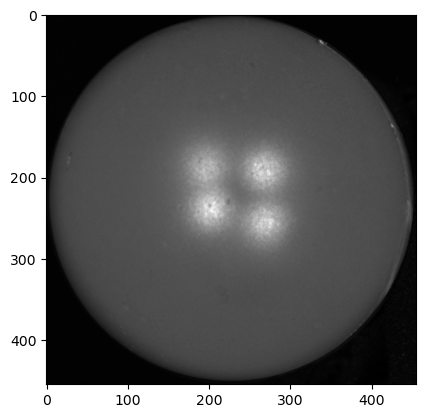

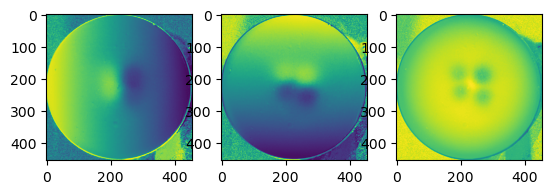

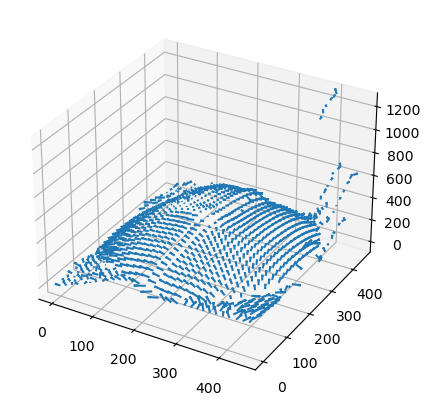

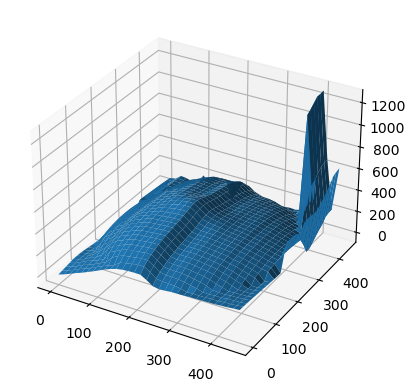

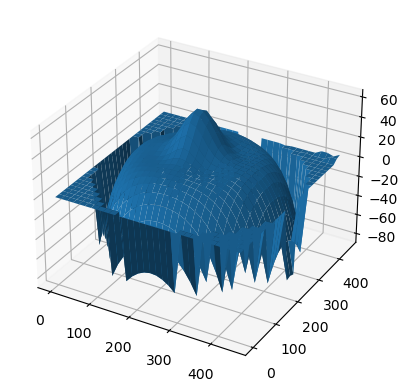

...

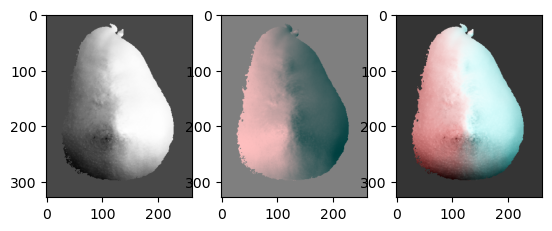

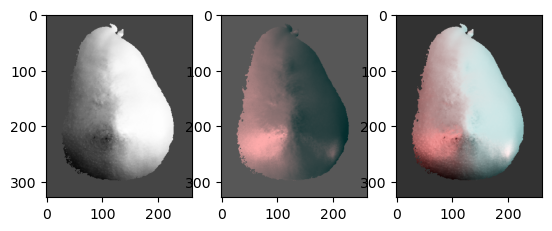

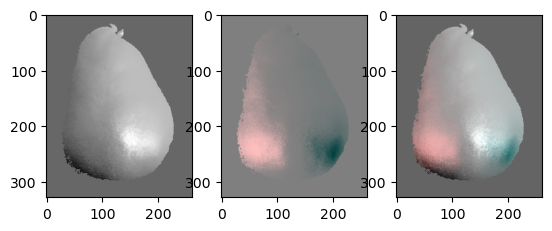

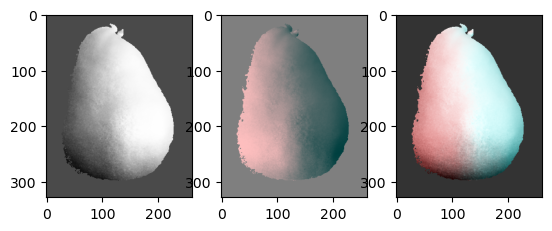

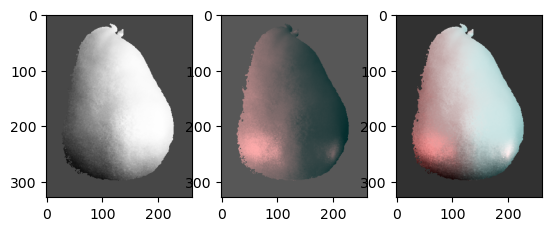

In [124]:
from mpl_toolkits.mplot3d import Axes3D

normals_sphere_original, mask_sphere = f(data_sphere, "original")    
normals_sphere_diffuse,  mask_sphere = f(data_sphere, "diffuse")
normals_pear_original,   mask_pear   = f(data_pear, "original")
normals_pear_diffuse,    mask_pear   = f(data_pear, "diffuse")
light_color = []
light_color.append(np.matrix([1,1,1]))
light_color.append(np.matrix([1,.5,.5]))
light_loc = []
light_loc.append(np.array([-1/3, 1/3, 1/3]))
light_loc.append(np.array([1, 0, 0]))

normals_list = [normals_sphere_original, normals_sphere_diffuse, normals_pear_original, normals_pear_diffuse]
mask_list    = [mask_sphere, mask_sphere, mask_pear, mask_pear]

materials =[[ 0, 0.1, 0.75,  5 ],
      [0, 0.5, 0.1, 5],
      [0, 0.5, 0.5, 10]]
view = np.matrix([0,0,1])

for normals, mask in zip(normals_list, mask_list):
    for material in materials:
        xlen = normals.shape[0]
        ylen = normals.shape[1]
        image_total = np.zeros((xlen, ylen, 3))
        for i in range(2):
            color = light_color[i]
            loc = light_loc[i]
            image = phong(normals, loc, color, material, view, mask)
            image = (image - image.min())/(image.max() - image.min())
            plt.subplot(131+i)
            plt.imshow(image)
            image_total += image
        image_total = (image_total - image_total.min())/(image_total.max() - image_total.min())
        plt.subplot(133)
        plt.imshow(image_total)
        plt.show()

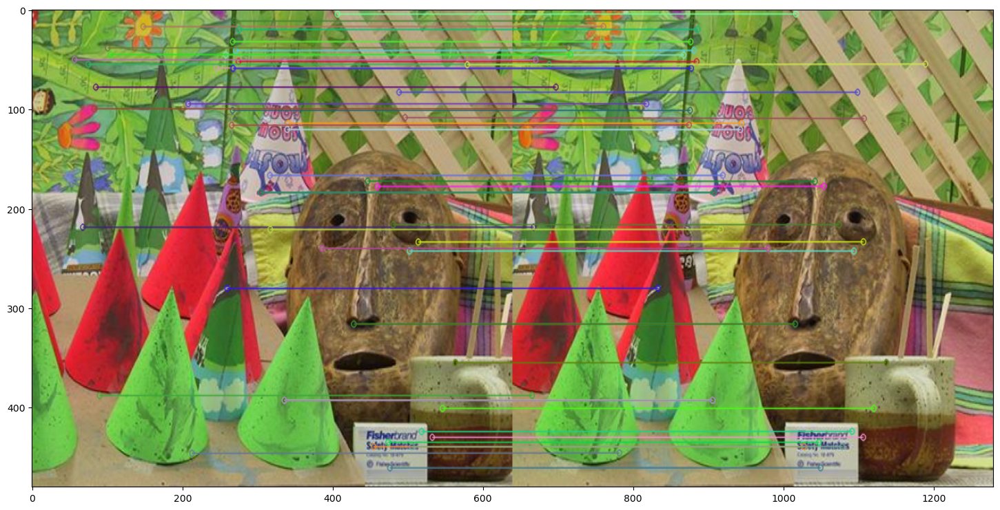

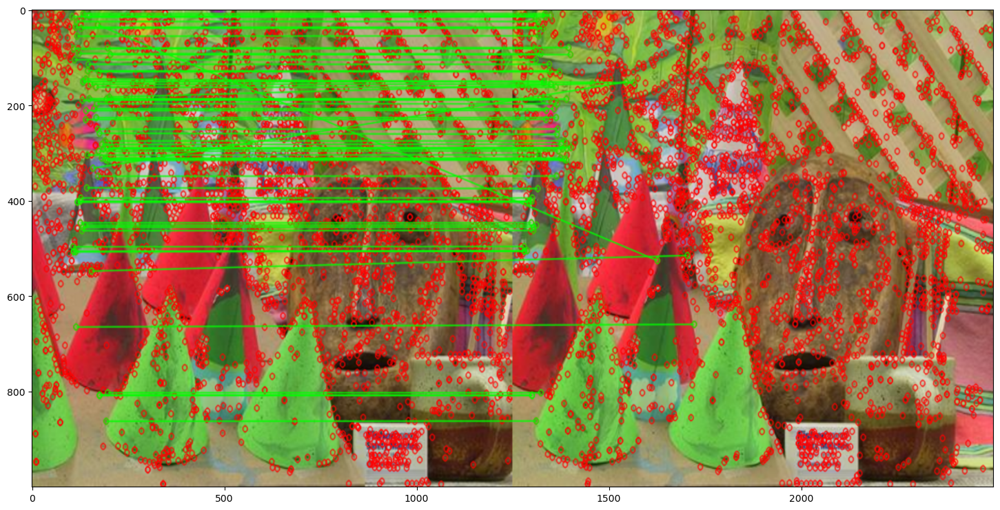

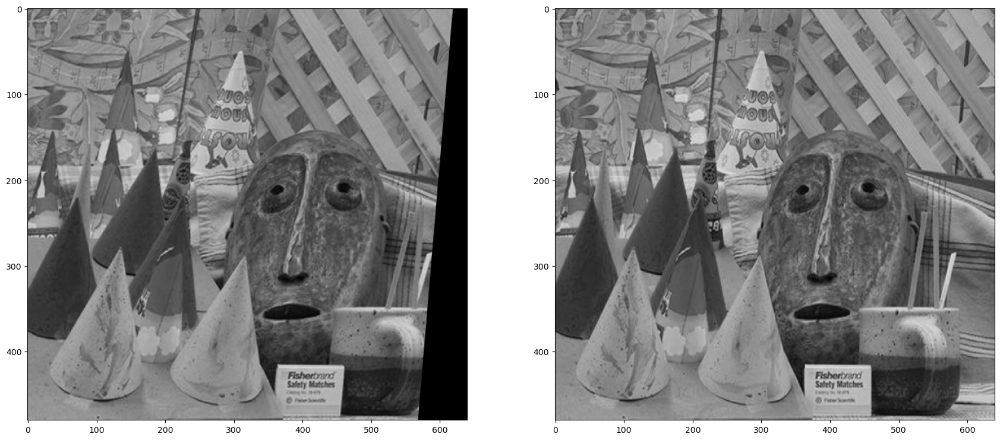

(<matplotlib.image.AxesImage at 0x2a9f63460>, None)

In [141]:
import numpy as np
import cv2 as cv

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv.cvtColor(img1,cv.COLOR_GRAY2BGR)
    img2 = cv.cvtColor(img2,cv.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

img1 = cv2.cvtColor(cv2.imread("img/left.png"), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread("img/right.png"), cv2.COLOR_BGR2RGB)
img1 = cv2.resize(img1, (640, 480))
img2 = cv2.resize(img2, (640, 480))

sift = cv2.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
fig, ax = plt.subplots(figsize=(18, 9))
ax.imshow(img3, aspect="auto"),plt.show()

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)   # or pass empty dictionary
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors_1, descriptors_2, k=2)


matchesMask = [[0, 0] for i in range(len(matches))]
good = []
pts1 = []
pts2 = []

for i, (m, n) in enumerate(matches):
    if m.distance < 0.80*n.distance:
        # Keep this keypoint pair
        matchesMask[i] = [1, 0]
        good.append(m)
        pts2.append(keypoints_2[m.trainIdx].pt)
        pts1.append(keypoints_1[m.queryIdx].pt)


# Draw the keypoint matches between both pictures
# Still based on: https://docs.opencv.org/master/dc/dc3/tutorial_py_matcher.html
draw_params = dict(matchColor=(0, 255, 0),
                   singlePointColor=(255, 0, 0),
                   matchesMask=matchesMask[300:500],
                   flags=cv2.DrawMatchesFlags_DEFAULT)

keypoint_matches = cv2.drawMatchesKnn(
    img1, keypoints_1, img2, keypoints_2, matches[300:500], None, **draw_params)
keypoint_matches = cv2.resize(keypoint_matches, (2500,1000))
fig, ax = plt.subplots(figsize=(18, 9))
ax.imshow(keypoint_matches, aspect="auto"),plt.show()

pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img5,img6 = drawlines(img1,img2,lines1,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img2,img1,lines2,pts2,pts1)

h1, w1 = img1.shape
h2, w2 = img2.shape
_, H1, H2 = cv.stereoRectifyUncalibrated(
    np.float32(pts1), np.float32(pts2), F, imgSize=(w1, h1)
)

img1_rectified = cv.warpPerspective(img1, H1, (w1, h1))
img2_rectified = cv.warpPerspective(img2, H2, (w2, h2))
fig, ax = plt.subplots(1,2,figsize=(21, 9))
imr1 = cv2.cvtColor(img1_rectified, cv2.COLOR_BGR2RGB)
imr2 = cv2.cvtColor(img2_rectified, cv2.COLOR_BGR2RGB)
ax[0].imshow(imr1, aspect="auto")
ax[1].imshow(imr2, aspect="auto"),plt.show()

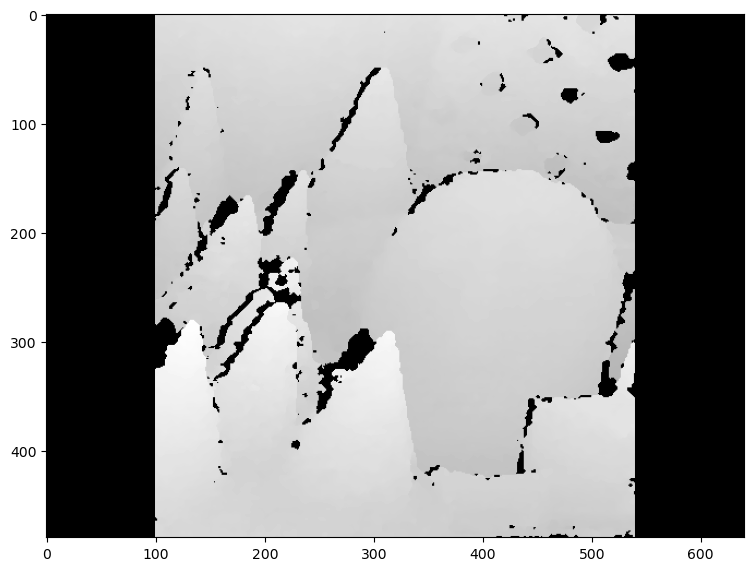

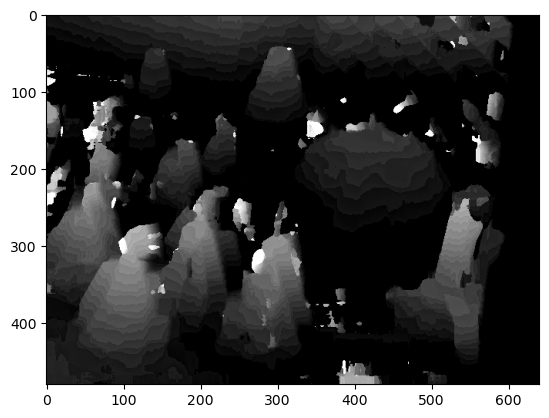

In [155]:
block_size = 5
min_disp = -100
max_disp = 100
# Maximum disparity minus minimum disparity. The value is always greater than zero.
# In the current implementation, this parameter must be divisible by 16.
num_disp = max_disp - min_disp
# Margin in percentage by which the best (minimum) computed cost function value should "win" the second best value to consider the found match correct.
# Normally, a value within the 5-15 range is good enough
uniquenessRatio = 10
# Maximum size of smooth disparity regions to consider their noise speckles and invalidate.
# Set it to 0 to disable speckle filtering. Otherwise, set it somewhere in the 50-200 range.
speckleWindowSize = 300
# Maximum disparity variation within each connected component.
# If you do speckle filtering, set the parameter to a positive value, it will be implicitly multiplied by 16.
# Normally, 1 or 2 is good enough.
speckleRange = 2
disp12MaxDiff = 0

stereo = cv.StereoSGBM_create(
    minDisparity=min_disp,
    numDisparities=num_disp,
    blockSize=block_size,
    uniquenessRatio=uniquenessRatio,
    speckleWindowSize=speckleWindowSize,
    speckleRange=speckleRange,
    disp12MaxDiff=disp12MaxDiff,
    P1=8 * 1 * block_size * block_size,
    P2=32 * 1 * block_size * block_size,
)
disparity_SGBM = stereo.compute(img1_rectified, img2_rectified)

# Normalize the values to a range from 0..255 for a grayscale image
disparity_SGBM = cv.normalize(disparity_SGBM, disparity_SGBM, alpha=255,
                              beta=0, norm_type=cv.NORM_MINMAX)
disparity_SGBM = np.uint8(disparity_SGBM)
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(disparity_SGBM, 'gray'),plt.show()

stereo=computedisparity2(img1_rectified, img2_rectified,30,20)
plt.imshow(stereo, cmap='gray')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
--- 25.804590225219727 seconds ---


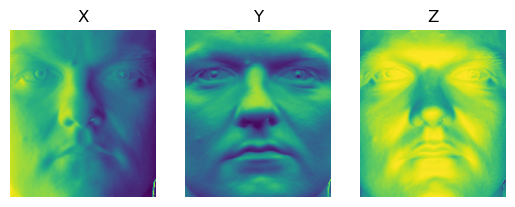

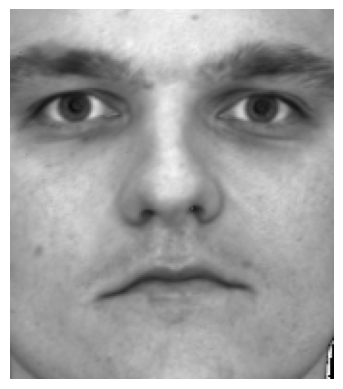

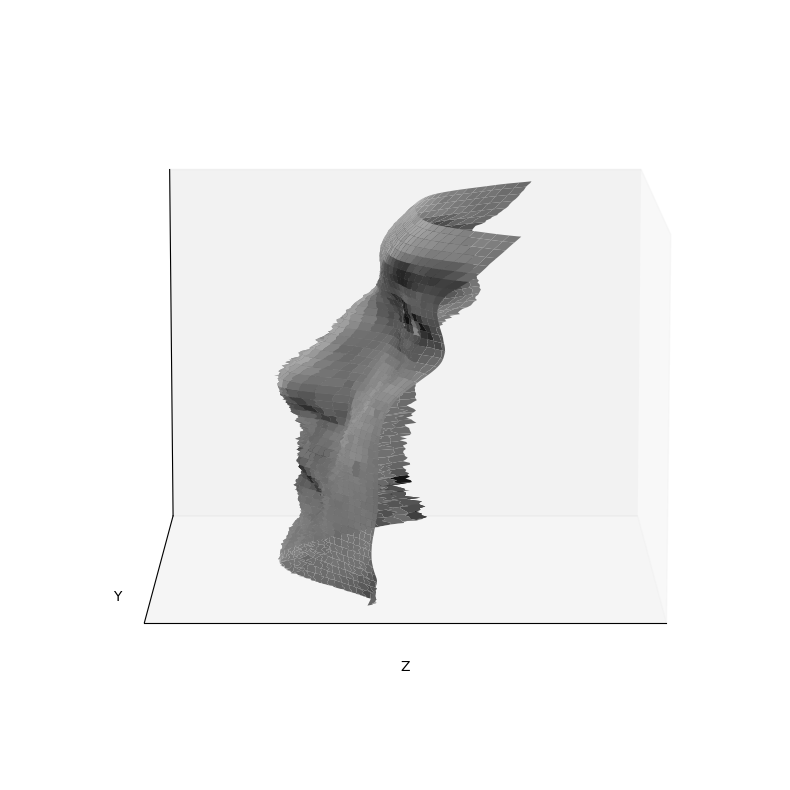

In [214]:
%matplotlib inline
import os
import sys
import glob
import re
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image

%load_ext autoreload
%autoreload 2

def LoadFaceImages(pathname, subject_name, num_images):
    """
    Load the set of face images.  
    The routine returns
        ambimage: image illuminated under the ambient lighting
        imarray: a 3-D array of images, h x w x Nimages
        lightdirs: Nimages x 3 array of light source directions
    """

    def load_image(fname):
        return np.asarray(Image.open(fname))

    def fname_to_ang(fname):
        # Parse light source directions from filename
        yale_name = os.path.basename(fname)
        return int(yale_name[12:16]), int(yale_name[17:20])

    def sph2cart(az, el, r):
        # Parse sphere coor -> cartesian coor
        rcos_theta = r * np.cos(el)
        x = rcos_theta * np.cos(az)
        y = rcos_theta * np.sin(az)
        z = r * np.sin(el)
        return x, y, z

    ambimage = load_image(
        os.path.join(pathname, subject_name + '_P00_Ambient.pgm')) # load ambient image
    im_list = glob.glob(os.path.join(pathname, subject_name + '_P00A*.pgm')) # load image list
    if num_images <= len(im_list): 
        im_sub_list = np.random.choice(im_list, num_images, replace=False) # choose sublist to use
    else:
        print(
            'Total available images is less than specified.\nProceeding with %d images.\n'
            % len(im_list))
        im_sub_list = im_list
    im_sub_list.sort()
    imarray = np.stack([load_image(fname) for fname in im_sub_list], axis=-1) # stacked images data
    Ang = np.array([fname_to_ang(fname) for fname in im_sub_list]) # stacked light sources data

    x, y, z = sph2cart(Ang[:, 0] / 180.0 * np.pi, Ang[:, 1] / 180.0 * np.pi, 1)
    lightdirs = np.stack([y, z, x], axis=-1)
    return ambimage, imarray, lightdirs
def save_outputs(subject_name, albedo_image, surface_normals):
    im = Image.fromarray((albedo_image*255).astype(np.uint8))
    im.save("%s_albedo.jpg" % subject_name)
    im = Image.fromarray((surface_normals[:,:,0]*128+128).astype(np.uint8))
    im.save("%s_normals_x.jpg" % subject_name)
    im = Image.fromarray((surface_normals[:,:,1]*128+128).astype(np.uint8))
    im.save("%s_normals_y.jpg" % subject_name)
    im = Image.fromarray((surface_normals[:,:,2]*128+128).astype(np.uint8))
    im.save("%s_normals_z.jpg" % subject_name)

def set_aspect_equal_3d(ax):
    """https://stackoverflow.com/questions/13685386"""
    """Fix equal aspect bug for 3D plots."""
    xlim = ax.get_xlim3d()
    ylim = ax.get_ylim3d()
    zlim = ax.get_zlim3d()
    from numpy import mean
    xmean = mean(xlim)
    ymean = mean(ylim)
    zmean = mean(zlim)
    plot_radius = max([
        abs(lim - mean_)
        for lims, mean_ in ((xlim, xmean), (ylim, ymean), (zlim, zmean))
        for lim in lims
    ])
    ax.set_xlim3d([xmean - plot_radius, xmean + plot_radius])
    ax.set_ylim3d([ymean - plot_radius, ymean + plot_radius])
    ax.set_zlim3d([zmean - plot_radius, zmean + plot_radius])


def display_output(albedo_image, height_map):
    fig = plt.figure()
    plt.imshow(albedo_image, cmap='gray')
    plt.axis('off')
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection='3d')
    ax.view_init(10, 90)
    ax.mouse_init(rotate_btn=1, zoom_btn=3)
    X = np.arange(albedo_image.shape[0])
    Y = np.arange(albedo_image.shape[1])
    X, Y = np.meshgrid(Y, X)
    H = np.flipud(np.fliplr(height_map))
    A = np.flipud(np.fliplr(albedo_image))
    A = np.stack([A, A, A], axis=-1)
    ax.xaxis.set_ticks([])
    ax.xaxis.set_label_text('Z')
    ax.yaxis.set_ticks([])
    ax.yaxis.set_label_text('X')
    ax.zaxis.set_ticks([])
    ax.yaxis.set_label_text('Y')
    surf = ax.plot_surface(
        H, X, Y, cmap='gray', facecolors=A, linewidth=0, antialiased=True)
    set_aspect_equal_3d(ax)

def plot_surface_normals(surface_normals):
    """
    surface_normals: h x w x 3 matrix.
    """
    fig = plt.figure()
    ax = plt.subplot(1, 3, 1)
    ax.axis('off')
    ax.set_title('X')
    im = ax.imshow(surface_normals[:,:,0])
    ax = plt.subplot(1, 3, 2)
    ax.axis('off')
    ax.set_title('Y')
    im = ax.imshow(surface_normals[:,:,1])
    ax = plt.subplot(1, 3, 3)
    ax.axis('off')
    ax.set_title('Z')
    im = ax.imshow(surface_normals[:,:,2])
    
def preprocess(ambimage, imarray):
    """
    preprocess the data: 
        1. subtract ambient_image from each image in imarray.
        2. make sure no pixel is less than zero.
        3. rescale values in imarray to be between 0 and 1.
    Inputs:
        ambimage: h x w
        imarray: h x w x Nimages
    Outputs:
        processed_imarray: h x w x Nimages
    """
    processed_imarray = np.clip(imarray - ambimage[:,:,np.newaxis], a_min = 0, a_max = None).astype(float)
    np.true_divide(processed_imarray, processed_imarray.max(), out=processed_imarray)
    return processed_imarray

def photometric_stereo(imarray, light_dirs):
    """
    Inputs:
        imarray:  h x w x Nimages
        light_dirs: Nimages x 3
    Outputs:
        albedo_image: h x w
        surface_norms: h x w x 3
    """
    #g = np.zeros((3, 192*168))
    V = light_dirs
    I = imarray.transpose(2,0,1).reshape(imarray.shape[2], -1)
    g = np.linalg.lstsq(V, I, rcond=None)[0].transpose(1,0)
    ro = np.sqrt(np.einsum('...i,...i', g, g))    
    surface_normals = (g/(ro[:,None])).reshape(192, 168, 3)
    albedo_image = ro.reshape(192, 168)
    return albedo_image, surface_normals

def get_surface(surface_normals, integration_method):
    """
    Inputs:
        surface_normals:h x w x 3
        integration_method: string in ['average', 'column', 'row', 'random']
    Outputs:
        height_map: h x w
    """
    fx = surface_normals[:,:,0]/surface_normals[:,:,2]
    fy = surface_normals[:,:,1]/surface_normals[:,:,2]
    rh = np.cumsum(fx, axis=1)[0] + np.cumsum(fy, axis=0)
    ch = np.cumsum(fx, axis=1) + np.cumsum(fy, axis=0)[0]
    if integration_method == 'row':
        return rh
    elif integration_method == 'column':
        return ch
    elif integration_method == 'average':
        return (ch+rh)/2
    elif integration_method == 'random':
        height_maps = []
        PATH_COUNT = 10
        for i in range(PATH_COUNT):
            height_maps.append(np.zeros([fx.shape[0], fx.shape[1]]))
        for r in range(fx.shape[0]):
            for c in range(fx.shape[1]):
                path_arr = np.append(np.ones(r), np.zeros(c))
                for i in range(PATH_COUNT):
                    np.random.shuffle(path_arr)
                    r_cur = r
                    c_cur = c
                    for di in path_arr:
                        if di == 1:
                            height_maps[i][r][c] += fy[r_cur][c_cur]
                            r_cur -= 1
                        else:
                            height_maps[i][r][c] += fx[r_cur][c_cur]
                            c_cur -= 1
        
        return np.sum(height_maps, axis=0)/PATH_COUNT
    
root_path = 'croppedyale/'
#subject_names = ['yaleB01', 'yaleB02', 'yaleB05', 'yaleB07']
#integration_methods = ['row', 'column', 'average', 'random']

subject_names = ['yaleB07']
integration_methods = ['random']
save_flag = False


for subject_name in subject_names:
    
    full_path = '%s%s' % (root_path, subject_name)
    
    ambient_image, imarray, light_dirs = LoadFaceImages(full_path, subject_name, 64)
    processed_imarray = preprocess(ambient_image, imarray)
    albedo_image, surface_normals = photometric_stereo(processed_imarray,
                                                   light_dirs)
    plot_surface_normals(surface_normals)
    
    import time
    
    for integration_method in integration_methods:
        start_time = time.time()
        height_map = get_surface(surface_normals, integration_method)
        print("--- %s seconds ---" % (time.time() - start_time))
        display_output(albedo_image, height_map)
    
    if save_flag:
        save_outputs(subject_name, albedo_image, surface_normals)

[ WARN:0@161359.748] global /Users/xperience/actions-runner/_work/opencv-python/opencv-python/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('left.png'): can't open/read file: check file path/integrity


error: OpenCV(4.6.0) /Users/xperience/actions-runner/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/deriv.cpp:419: error: (-215:Assertion failed) !_src.empty() in function 'Sobel'
